## Earthquake Prediction

Earthquakes are the sudden and violent shaking of the ground caused by the movement of tectonic plates which causes are amounts of devastation. We believe that predicting earthquake probability for a given coordinate can provide valuable information for disaster management and emergency response, and can ultimately help to save lives and reduce the impact of earthquakes on communities. We are going to use an earthquake dataset to find out the probability of an earthquake happening given a pair of coordinates.

Problem question: What is the probability of an earthquake occurring in a chosen location in China and its surroundings?


In [1]:
#Import basic libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
import math
import random
sb.set()
%matplotlib inline

In [2]:
pip install cartopy


[notice] A new release of pip is available: 23.0.1 -> 23.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install geopy


[notice] A new release of pip is available: 23.0.1 -> 23.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
earthquakedata=pd.read_csv("earthquakedata.csv")
earthquakedata.head()

,Time,Place,Latitude,Longitude,Depth,Mag,MagType,nst,gap,dmin,...,Updated,Unnamed: 14,Type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-02-17T09:37:34.868Z,"130 km SW of Tual, Indonesia",-6.5986,132.0763,38.615,6.1,mww,119.0,51.0,2.988,...,2023-02-17T17:58:24.040Z,NaN,earthquake,6.41,5.595,0.065,23.0,reviewed,us,us
1,2023-02-16T05:37:05.138Z,"7 km SW of Port-Olry, Vanuatu",-15.0912,167.0294,36.029,5.6,mww,81.0,26.0,0.392,...,2023-02-17T05:41:32.448Z,NaN,earthquake,5.99,6.080,0.073,18.0,reviewed,us,us
2,2023-02-15T18:10:10.060Z,"Masbate region, Philippines",12.3238,123.8662,20.088,6.1,mww,148.0,47.0,5.487,...,2023-02-16T20:12:32.595Z,NaN,earthquake,8.61,4.399,0.037,71.0,reviewed,us,us
3,2023-02-15T06:38:09.034Z,"54 km WNW of Otaki, New Zealand",-40.5465,174.5709,74.320,5.7,mww,81.0,40.0,0.768,...,2023-02-16T06:42:09.738Z,NaN,earthquake,3.68,4.922,0.065,23.0,reviewed,us,us
4,2023-02-14T13:16:51.072Z,"2 km NW of Lele?ti, Romania",45.1126,23.1781,10.000,5.6,mww,132.0,28.0,1.197,...,2023-02-17T09:15:18.586Z,NaN,earthquake,4.85,1.794,0.032,95.0,reviewed,us,us


In [5]:
print("Data type : ", type(earthquakedata))
print("Data dims : ", earthquakedata.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (37331, 23)


In [6]:
print(earthquakedata.dtypes)

Time                object
Place               object
Latitude           float64
Longitude          float64
Depth              float64
Mag                float64
MagType             object
nst                float64
gap                float64
dmin               float64
rms                float64
net                 object
ID                  object
Updated             object
Unnamed: 14        float64
Type                object
horizontalError    float64
depthError         float64
magError           float64
magNst             float64
status              object
locationSource      object
magSource           object
dtype: object


In [7]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import cartopy
import matplotlib.colors as mcolors


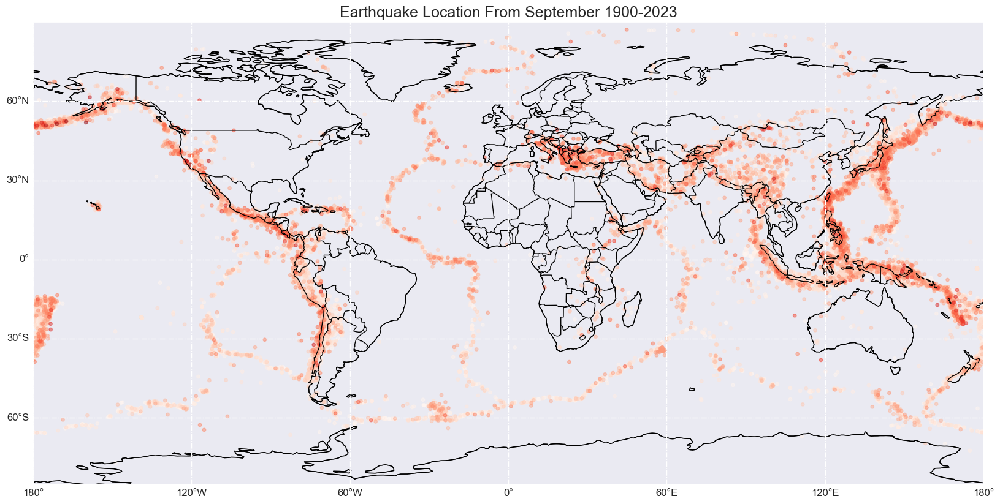

In [8]:
plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor="none", linewidth=1)
ax.add_feature(cfeature.BORDERS)


gl = ax.gridlines(linestyle='-.', draw_labels=True)
gl.top_labels = False
gl.right_labels = False
ax.coastlines()

p = ax.scatter(x=earthquakedata['Longitude'], y=earthquakedata['Latitude'], c =earthquakedata['Mag'].sort_values(), cmap='Reds', alpha=0.5, s=15)
plt.title('Earthquake Location From September 1900-2023', fontsize=18)

plt.show()

## We will be focusing the data points mainly in the China region.


We used China's furthest longitudes in the northern and southern direction and its furtest latitude in the western and eastern direction to determine how to filter the data.

In [9]:
filtered_data = earthquakedata.loc[(earthquakedata['Longitude'] >= 70) & (earthquakedata['Longitude'] <= 135) & (earthquakedata['Latitude'] >=15) & (earthquakedata['Latitude'] <= 60)]
filtered_data.head()

,Time,Place,Latitude,Longitude,Depth,Mag,MagType,nst,gap,dmin,...,Updated,Unnamed: 14,Type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
27,2023-01-29T23:49:38.212Z,"110 km ESE of Aral, China",40.0166,82.3702,28.000,5.7,mww,132.0,21.0,3.861,...,2023-02-15T05:39:54.884Z,NaN,earthquake,7.11,1.786,0.078,16.0,reviewed,us,us
33,2023-01-24T08:58:32.284Z,"62 km NW of Jumla, Nepal",29.5974,81.6522,25.227,5.6,mb,105.0,39.0,3.655,...,2023-01-27T04:20:40.414Z,NaN,earthquake,7.92,4.580,0.036,266.0,reviewed,us,us
56,2023-01-05T14:25:53.152Z,"45 km S of Jurm, Afghanistan",36.4617,70.7387,205.293,6.0,mww,108.0,22.0,2.364,...,2023-01-30T14:34:15.831Z,NaN,earthquake,6.59,3.260,0.039,62.0,reviewed,us,us
71,2022-12-17T18:06:02.988Z,"25 km ESE of Miyazaki, Japan",31.7958,131.6429,30.000,5.6,mww,204.0,70.0,1.054,...,2023-01-25T17:20:56.780Z,NaN,earthquake,5.03,1.800,0.069,20.0,reviewed,us,us
73,2022-12-15T04:03:15.817Z,NaN,23.7695,121.8115,13.000,5.9,mww,129.0,36.0,0.449,...,2023-02-13T05:17:46.964Z,NaN,earthquake,3.17,1.728,0.043,52.0,reviewed,us,us


We create a dataframe that consists of Latitude and Longitude only.

In [10]:
lat_long = pd.DataFrame(filtered_data[["Latitude","Longitude"]])
lat_long.head()

,Latitude,Longitude
27,40.0166,82.3702
33,29.5974,81.6522
56,36.4617,70.7387
71,31.7958,131.6429
73,23.7695,121.8115


In [11]:
print("Data type : ", type(filtered_data))
print("Data dims : ", filtered_data.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (3316, 23)


In [12]:
print("Data type : ", type(lat_long))
print("Data dims : ", lat_long.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (3316, 2)


As seen below, data points are earthquake that occured within the China region.

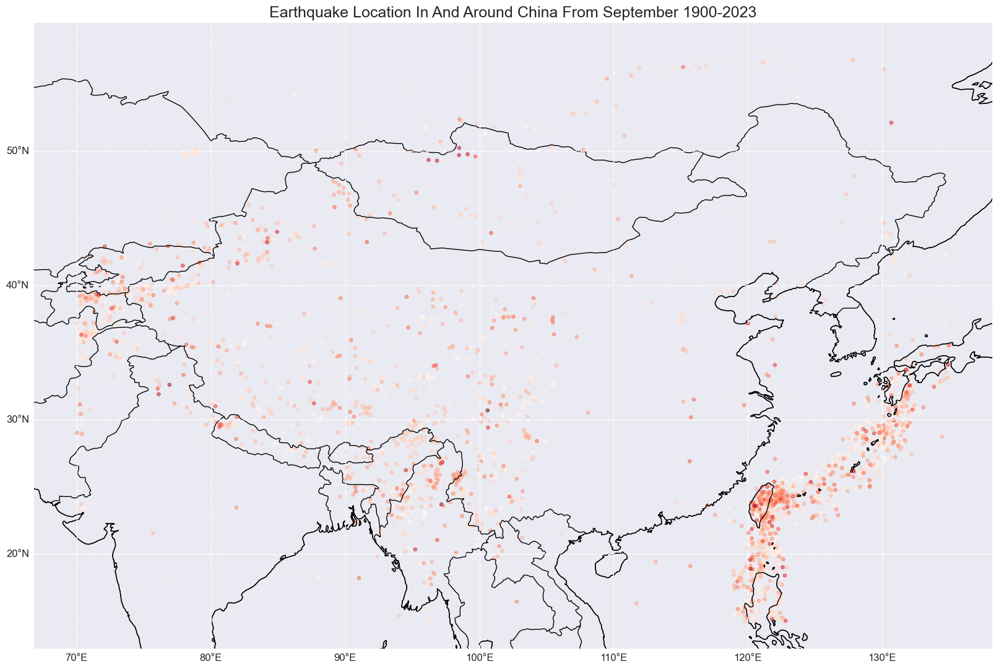

In [13]:
plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor="none", linewidth=1)
ax.add_feature(cfeature.BORDERS)


gl = ax.gridlines(linestyle='-.', draw_labels=True)
gl.top_labels = False
gl.right_labels = False
ax.coastlines()

p = ax.scatter(x=filtered_data['Longitude'], y=filtered_data['Latitude'], c =filtered_data['Mag'].sort_values(), cmap='Reds', alpha=0.5, s=15)
plt.title('Earthquake Location In And Around China From September 1900-2023', fontsize=18)

plt.show()

## K-Means Clustering

In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(lat_long['Longitude'], lat_long['Latitude'], test_size=0.20, random_state=1)
print("Data type : ", type(y_test))
print("Data dims : ", y_test.shape)
y_train.head()

Data type :  <class 'pandas.core.series.Series'>
Data dims :  (664,)


2671     24.450
23372    25.780
26032    30.848
18160    29.805
24944    24.126
Name: Latitude, dtype: float64

In [15]:
data = list(zip(X_train, y_train))
print(data)
print("No. of data: ", len(data))


[(126.3174, 24.45), (129.532, 25.78), (130.864, 30.848), (130.603, 29.805), (122.253, 24.126), (121.917, 15.578), (129.3846, 29.4132), (123.736, 23.598), (94.9055, 24.7382), (121.064, 25.012), (132.137, 33.953), (76.955, 37.494), (84.543, 41.399), (129.92, 28.837), (77.72, 39.813), (133.899, 35.464), (82.603, 41.844), (121.913, 21.576), (96.393, 24.159), (83.16, 31.008), (81.322, 41.329), (86.749, 33.243), (78.829, 49.928), (120.023, 20.654), (119.33, 18.149), (101.154, 26.979), (99.713, 45.141), (121.249, 23.046), (89.331, 27.264), (121.632, 23.912), (120.6014, 22.9375), (82.788, 42.315), (117.708, 39.268), (95.226, 29.585), (115.039, 37.535), (77.714, 36.034), (95.138, 29.889), (130.086, 29.247), (121.397, 19.945), (122.543, 23.948), (122.6, 24.802), (130.216, 29.328), (98.293, 25.622), (78.983, 49.897), (71.16, 36.369), (101.78, 26.467), (94.409, 28.873), (95.932, 24.027), (96.127, 25.086), (97.396, 30.353), (121.103, 18.588), (119.88, 15.22), (100.103, 27.412), (72.707, 38.107), (1

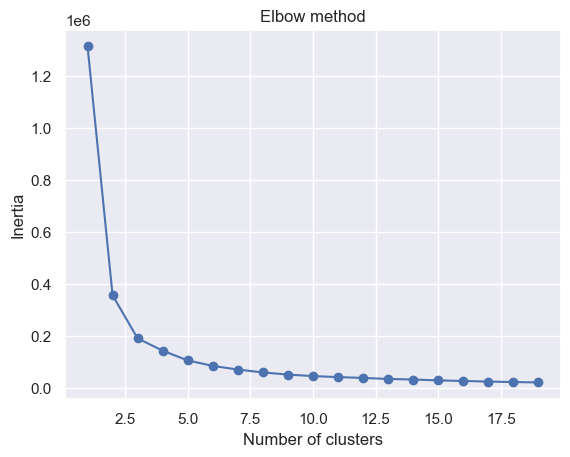

In [16]:
from sklearn.cluster import KMeans

inertias = []

for i in range(1,20):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)


graph = plt.plot(range(1,20), inertias, marker = 'o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

Using the elbow method as a reference to determine the number of clusters, we decided to use 3 clusters as a middle point as it is the point where the curve starts to flatten, just like an elbow, and as such, we have chose to do a range from 1 to 5 clusters to see which is the best cluster.

For the K-Means Clustering model, the hyperparameters used were n_clusters and random_state. This is because for K-Means model, we have to provide the algorithm with the number of clusters that we want, which we have done through iteration of the different number of clusters. In addition, we have to set random_state in order to generate the same clusters every single time because the clustering of the algorithm would change slightly every time we regenerate it.

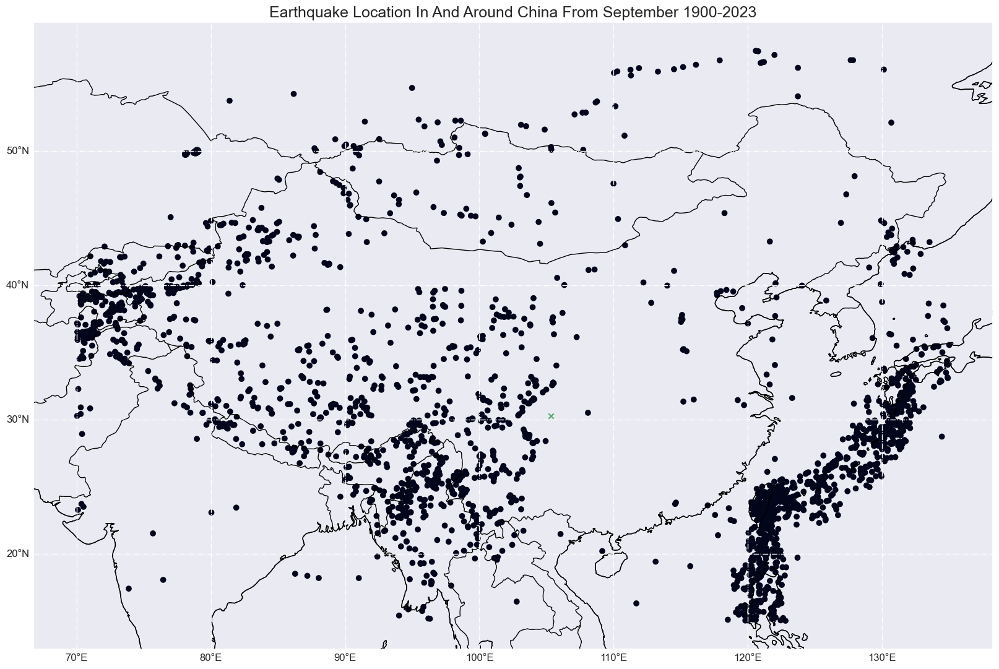

For  1  cluster: 
Nearest cluster:  1
Coordinates of test point:  (107.1412, 34.3)
Coordinates of centroid of nearest cluster:  (105.30373612368024, 30.290518174962294)
Distance of furthest point within nearest cluster from its centroid:  36.27941479349131
Distance from test point to centroid of nearest cluster:  4.41046686894797
Probability of eartquake happening at test point:  0.8784305950343161
Random Datapoints:  [(107.5759, 24.2744), (122.8659, 52.0615), (112.4757, 22.2103), (103.8435, 29.7498), (86.2498, 57.8768), (134.7762, 17.005), (125.9105, 42.1436), (94.8044, 27.7628), (113.8727, 35.5574), (114.581, 44.7831), (78.6436, 49.5527), (133.8569, 58.6225), (109.8662, 16.9917), (70.2636, 21.0288), (131.1651, 28.6287), (93.7995, 55.4188), (90.4336, 39.7042), (98.342, 17.9247), (107.9955, 52.9831), (80.1672, 25.0935), (96.8366, 16.6616), (102.2792, 51.8092), (112.7629, 39.0068), (125.5832, 21.736), (106.8703, 31.8379), (109.0848, 20.0812), (120.4083, 19.3473), (80.8136, 51.3352), (13

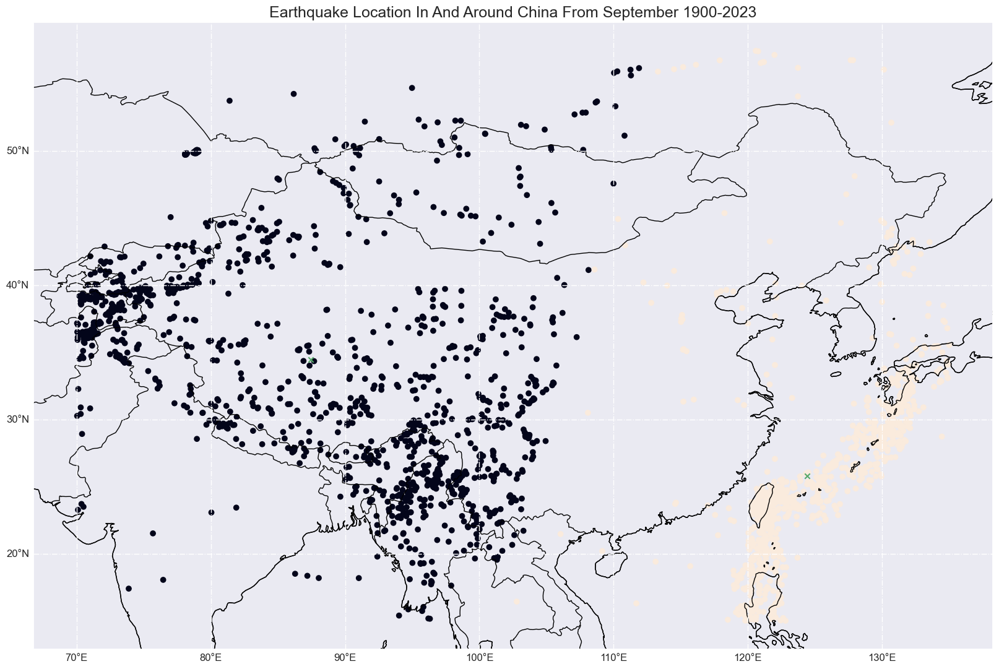

For  2  clusters: 
Nearest cluster:  2
Coordinates of test point:  (107.1412, 34.3)
Coordinates of centroid of nearest cluster:  (124.41557386895477, 25.819421996879875)
Distance of furthest point within nearest cluster from its centroid:  32.08926899868742
Distance from test point to centroid of nearest cluster:  19.24380928588288
Probability of eartquake happening at test point:  0.1935104099435161
Random Datapoints:  [(118.377, 52.4116), (76.1444, 39.5379), (113.5251, 26.0576), (94.9508, 18.4112), (119.3125, 39.6062), (77.7838, 49.0135), (131.6517, 36.4828), (128.6752, 42.1061), (93.1252, 35.9116), (132.6763, 54.2061), (98.1496, 41.5639), (91.7405, 53.1587), (123.8456, 30.2341), (92.8058, 57.6845), (105.42, 17.9526), (79.0475, 53.8073), (130.3915, 20.9756), (124.6956, 18.493), (91.2741, 34.6621), (127.8704, 35.4182), (94.6948, 38.3139), (74.0823, 37.0017), (85.3321, 22.0509), (73.7469, 55.197), (85.2894, 45.3732), (95.9978, 32.8314), (123.729, 26.3579), (99.3801, 35.0884), (119.9457

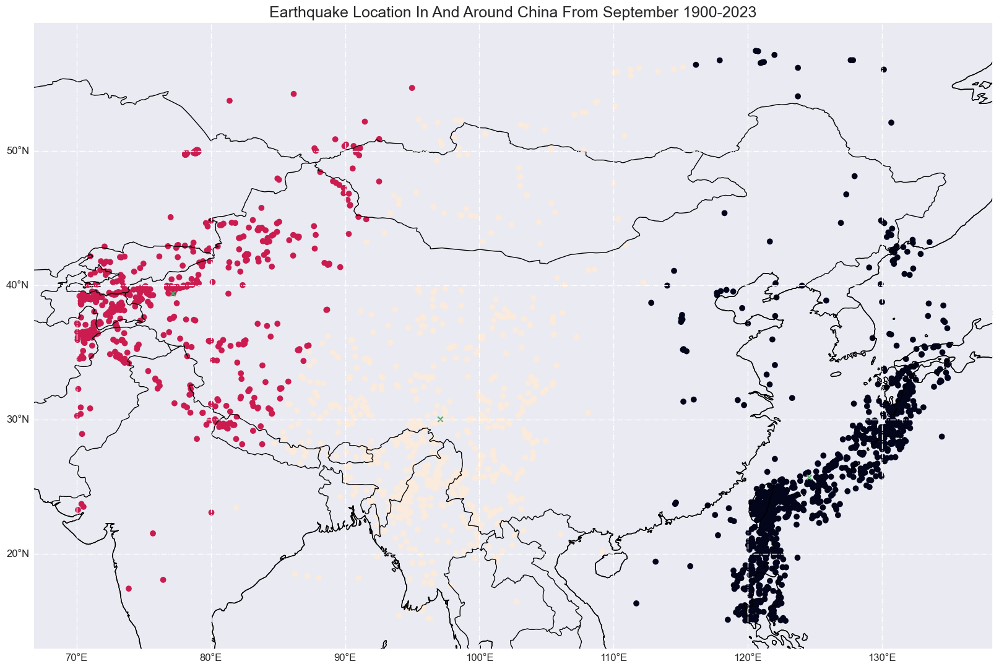

For  3  clusters: 
Nearest cluster:  3
Coordinates of test point:  (107.1412, 34.3)
Coordinates of centroid of nearest cluster:  (97.08966022099447, 30.055531767955802)
Distance of furthest point within nearest cluster from its centroid:  31.840519079844125
Distance from test point to centroid of nearest cluster:  10.910956076428995
Probability of eartquake happening at test point:  0.17969852330722139
Random Datapoints:  [(131.0395, 19.7391), (73.202, 40.5129), (90.6765, 21.0213), (108.6552, 29.7614), (118.5825, 37.7596), (108.3828, 38.4614), (108.6613, 16.1679), (120.7494, 37.3462), (94.9643, 28.9044), (80.9621, 52.4185), (106.4665, 23.279), (131.8632, 15.6295), (114.5009, 30.1794), (91.6811, 27.7649), (125.534, 37.6166), (82.188, 44.5578), (73.7452, 20.6201), (127.8514, 50.1021), (129.586, 54.8566), (78.39, 58.9033), (78.6658, 23.6461), (79.828, 53.2693), (92.9014, 18.9653), (118.0567, 55.2118), (99.123, 55.2201), (80.9273, 19.8839), (87.7369, 49.2019), (108.4547, 41.0166), (105.477

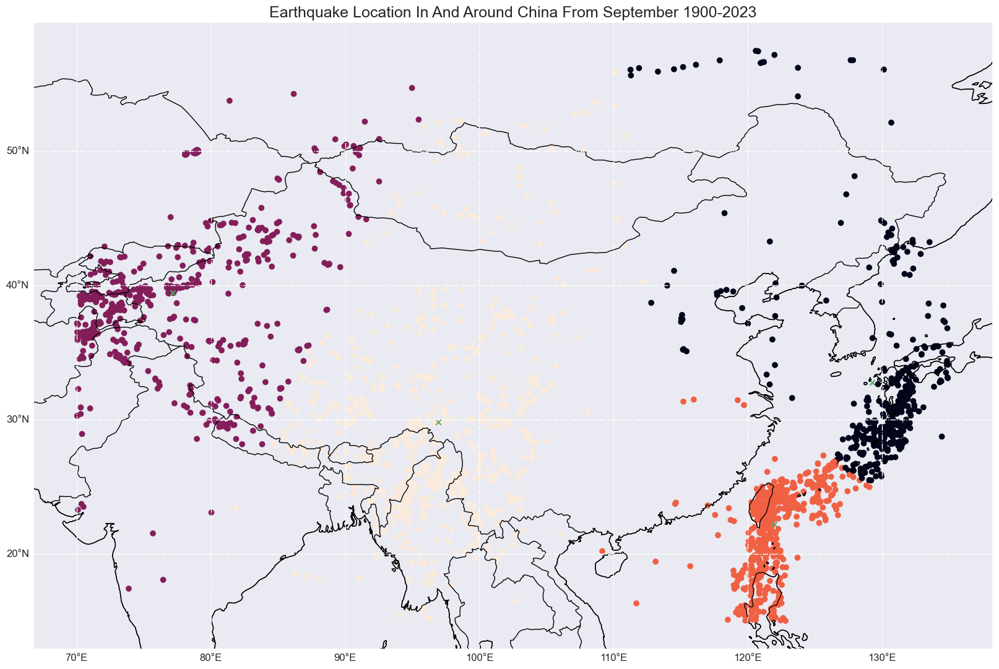

For  4  clusters: 
Nearest cluster:  4
Coordinates of test point:  (107.1412, 34.3)
Coordinates of centroid of nearest cluster:  (96.9291589958159, 29.827824267782425)
Distance of furthest point within nearest cluster from its centroid:  29.325442541180482
Distance from test point to centroid of nearest cluster:  11.148369264200625
Probability of eartquake happening at test point:  0.1675810932404978
Random Datapoints:  [(95.6299, 49.3758), (108.1997, 39.5418), (90.3431, 50.5929), (106.3827, 41.3859), (111.429, 39.8755), (89.0934, 18.985), (95.0145, 29.8932), (114.6663, 32.3481), (85.3994, 34.4511), (105.6702, 54.7252), (85.0456, 21.3407), (105.7466, 31.925), (88.0425, 38.7213), (106.6909, 54.3506), (82.4434, 50.6286), (91.1192, 57.8829), (119.9907, 58.4146), (116.8216, 29.7753), (73.0791, 40.7192), (95.0109, 48.4925), (82.672, 20.9341), (129.7301, 30.1139), (88.811, 58.5899), (110.3726, 36.0108), (73.1617, 57.5451), (75.5287, 53.5975), (72.6075, 45.7583), (103.523, 23.4687), (99.1154,

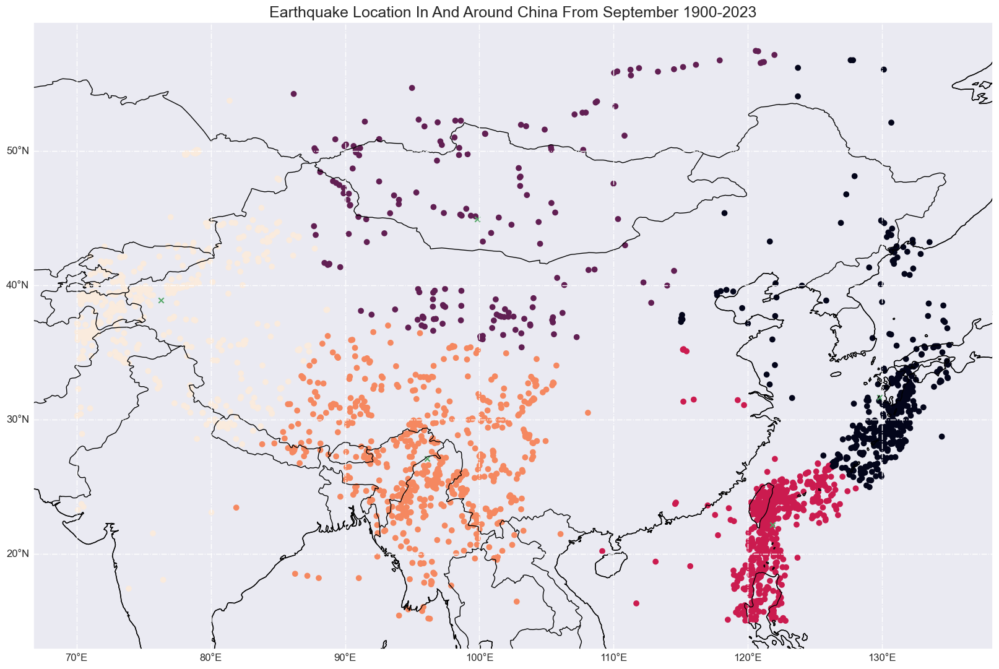

For  5  clusters: 
Nearest cluster:  2
Coordinates of test point:  (107.1412, 34.3)
Coordinates of centroid of nearest cluster:  (99.84803571428571, 44.93388956043957)
Distance of furthest point within nearest cluster from its centroid:  25.28381555927527
Distance from test point to centroid of nearest cluster:  12.894566781479865
Probability of eartquake happening at test point:  0.03344316836850113
Random Datapoints:  [(117.0697, 36.046), (117.6032, 17.1766), (103.6921, 33.6519), (92.4312, 19.7509), (80.1318, 40.9087), (125.036, 49.2666), (132.7606, 58.5068), (109.0113, 19.1324), (74.8068, 33.5977), (74.0546, 53.6471), (90.9071, 17.5111), (121.0818, 35.1655), (98.5647, 30.6868), (122.9875, 35.7371), (102.3731, 48.4236), (126.3931, 23.723), (128.6334, 42.0992), (91.8422, 24.8396), (91.2914, 53.621), (127.5432, 25.6243), (112.4192, 34.9466), (124.3412, 49.7398), (134.9808, 29.5395), (123.5872, 20.3656), (120.3308, 35.2065), (94.5842, 57.4506), (121.7639, 50.9974), (91.5886, 37.4653), (

In [17]:
random.seed(10)
testPoint=(round(random.uniform(70,135), 4), round(random.uniform(15,60), 4))
for i in range(1,6):
    plt.figure(figsize=(20, 20))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor="none", linewidth=1)
    ax.add_feature(cfeature.BORDERS)


    gl = ax.gridlines(linestyle='-.', draw_labels=True)
    gl.top_labels = False
    gl.right_labels = False
    ax.coastlines()

    kmeans = KMeans(n_clusters=i, random_state=1)
    kmeans.fit(data)
    centers = np.array(kmeans.cluster_centers_)

    plt.scatter(x=X_train, y=y_train, c =kmeans.labels_)
    plt.scatter(centers[:,0], centers[:,1], marker="x", color='g')
    plt.title('Earthquake Location In And Around China From September 1900-2023', fontsize=18)

    plt.show()

    centers=kmeans.cluster_centers_
    lon=[]
    lati=[]
    for c in centers:
        lon.append(c[0])
        lati.append(c[1])

    centers=list(zip(lon,lati))

    nearestCluster=centers[0]
    min_distance = math.dist(testPoint,centers[0])
    x=0
    for j in range(len(centers)):
        dist = math.dist(testPoint, centers[j])
        if dist < min_distance:
            min_distance = dist
            nearestCluster=centers[j]
            x=j

    if i==1:
        print("For ",i, " cluster: ")
    else:
        print("For ",i, " clusters: ")
    print("Nearest cluster: ", x+1)
    print("Coordinates of test point: ", testPoint)
    print("Coordinates of centroid of nearest cluster: ", nearestCluster)
    labels=kmeans.labels_
    df = pd.concat([X_train, y_train],axis=1, join="inner")
    cluster=df[labels==x]
    cluster=list(zip(cluster["Longitude"],cluster["Latitude"]))
    furthestDist=0
    count=0
    for d in cluster:
        count=count+1
        if math.dist(d,centers[x])>furthestDist:
            furthestDist=math.dist(d,centers[x])
    print("Distance of furthest point within nearest cluster from its centroid: ", furthestDist)
    print("Distance from test point to centroid of nearest cluster: ", min_distance)
    probability=((furthestDist - min_distance)/furthestDist)*(count/len(data))
    print("Probability of eartquake happening at test point: ", probability)
    testData= list(zip(X_test, y_test))
    randData=[]
    while len(randData)!=len(testData):
        count=0
        randomPoint=(round(random.uniform(70,135), 4), round(random.uniform(15,60), 4))
        for ii in range(len(randData)):
            if randomPoint==randData[ii]:
                count=count+1
        if count>0:
            continue
        else:
            randData.append(randomPoint)

    print("Random Datapoints: ", randData)
    print("No. of test data: ", len(testData))
    print("No. of random data: ", len(randData))

    probabilites=[]

    for jj in randData:
        nearestClust=centers[0]
        min_dist = math.dist(jj,centers[0])
        X=0
        for cc in range(len(centers)):
            dist = math.dist(jj, centers[cc])
            if dist < min_dist:
                min_dist = dist
                nearestClust=centers[cc]
                X=cc
        ftDist=0
        count=0
        for e in cluster:
            count=count+1
            if math.dist(e,centers[X])>ftDist:
                ftDist=math.dist(e,centers[X])
        prob=((ftDist - min_dist)/ftDist)*(count/len(data))
        probabilites.append(prob)

    print("Probabilities: ", probabilites)
    print("No. of probabilities: ", len(probabilites))


    predictionError=[]
    ct=0
    for kk in randData:
        for ll in testData:
            if ll[0]-0.01<kk[0]<ll[0]+0.01 and ll[1]-0.01<kk[1]<ll[1]+0.01:
                pError=1-probabilites[ct]
            else:
                pError=probabilites[ct]
        predictionError.append(pError)
        ct=ct+1

    print("Prediction Errors: ", predictionError)
    print("No. of predicition error: ", len(predictionError))
    avePE=np.mean(predictionError)
    print("Average Prediction Error: ", avePE)
    print("\n")

    for k in range(kmeans.n_clusters):
        labels=kmeans.labels_
        df = pd.concat([X_train, y_train],axis=1, join="inner")
        cluster=df[labels==k]
        cluster=list(zip(cluster["Longitude"],cluster["Latitude"]))

        distance=0
        furthestPoint=0
        counter=0
        for l in cluster:
            counter=counter+1
            if math.dist(l,centers[k])>distance:
                distance=math.dist(l,centers[k])
                furthestPoint=l

        distToTestPoint=math.dist(testPoint,centers[k])        

        print ("For cluster ", k+1, ":")
        print("Number of points in cluster: ", counter)
        print("Coordinate of centroid:", centers[k])
        print("Coordinates of Furthest Point: ", furthestPoint)
        print("Furthest distance of point from centroid: ", distance)
        print("Probability assigned to the cluster: ", counter/len(data))
        print("Distance to test point: ", distToTestPoint)
        print("\n")

We have decided to use 664 random test points to test the prediction error as that is the number of points in the test set.

To test the prediction error of the model, we check whether the random test points generated coincides with the location of earthquakes in the test set by giving the test points a 0.01 degree buffer around the test points. If the test points generated coincides with the location of the earthquakes in the test set, the prediction error would be (1 - probability of earthquake at that test point using the model). If the test points generated does not coincide with the location of the earthquakes in the test set, the prediction error would be the probability of earthquake at that test point using the model. From there, we calculate the average prediction error for different number of clusters using K-Means clustering and then select the best number of clusters to predict the probability of an earthquake using the K-Means Model.

As we can see from above, the best hyperparameter configuration of n_clusters for K-Means Clustering model is 5 as it has the lowest average prediction error, which indicates that having 5 clusters to predict the probability of an earthquake is the best.



## Hierarchical Clustering

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [19]:
#Turn data into a set of points
train_coordinates = list(zip(X_train,y_train))
print(train_coordinates)

[(126.3174, 24.45), (129.532, 25.78), (130.864, 30.848), (130.603, 29.805), (122.253, 24.126), (121.917, 15.578), (129.3846, 29.4132), (123.736, 23.598), (94.9055, 24.7382), (121.064, 25.012), (132.137, 33.953), (76.955, 37.494), (84.543, 41.399), (129.92, 28.837), (77.72, 39.813), (133.899, 35.464), (82.603, 41.844), (121.913, 21.576), (96.393, 24.159), (83.16, 31.008), (81.322, 41.329), (86.749, 33.243), (78.829, 49.928), (120.023, 20.654), (119.33, 18.149), (101.154, 26.979), (99.713, 45.141), (121.249, 23.046), (89.331, 27.264), (121.632, 23.912), (120.6014, 22.9375), (82.788, 42.315), (117.708, 39.268), (95.226, 29.585), (115.039, 37.535), (77.714, 36.034), (95.138, 29.889), (130.086, 29.247), (121.397, 19.945), (122.543, 23.948), (122.6, 24.802), (130.216, 29.328), (98.293, 25.622), (78.983, 49.897), (71.16, 36.369), (101.78, 26.467), (94.409, 28.873), (95.932, 24.027), (96.127, 25.086), (97.396, 30.353), (121.103, 18.588), (119.88, 15.22), (100.103, 27.412), (72.707, 38.107), (1

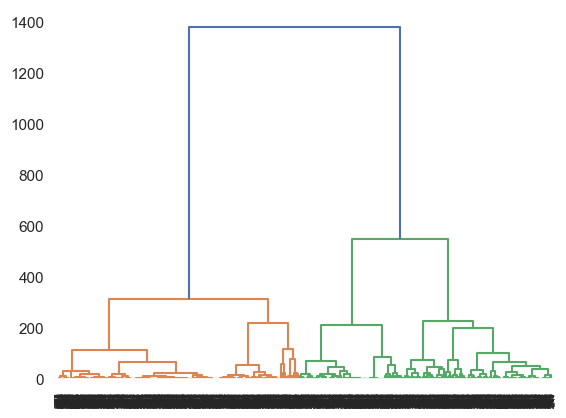

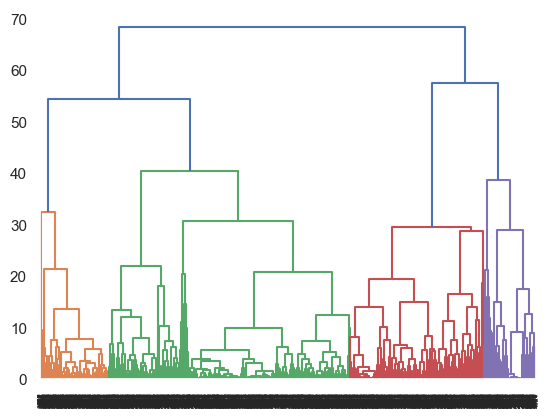

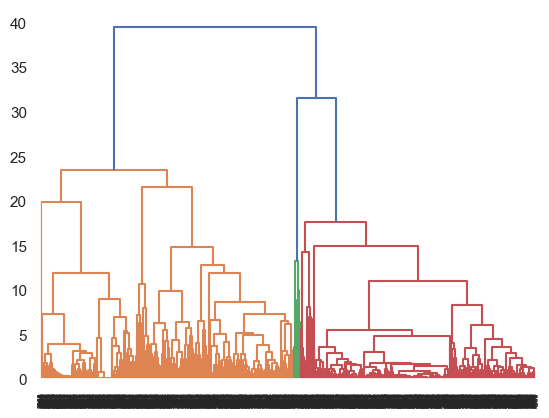

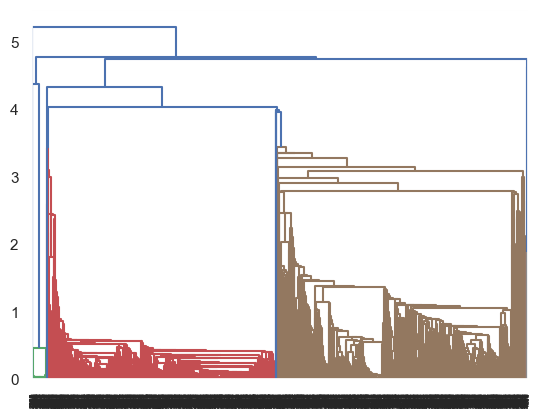

In [20]:
#Compute the linkage between all of the different points
for linkages in ("ward", "complete", "average", "single"):
    linkage_train = linkage(train_coordinates, method= linkages)
    dendrogram(linkage_train)
    plt.show()

To find the the optimal number of clusters, we look at the highest vertical distance of the dendogram which is 2 for ward and single or 3 for average and complete. Therefore, we will use 2 as a reference starting point to find out the probability till clusters of 5 for each linkage method later on.

For Hierarchical Clustering model, the hyperparameters used were n_clusters and linkages (which can be seen in the code below). Similar to K-Means Clustering, we have to provide the algorithm with the number of clusters we want, which we have done through the iteration of different number of clusters as well. The linkage hyperparameter is used to determine the method of clustering, which will be shown in the Hierarchical Clustering section later on.

To find out which linkages is the best, we compute the average prediction error and find out the lowest prediction error for each linkage method: ward, complete, single and average. Once we have determined which linkage is the best, we compare it with k-means to determine the better model.

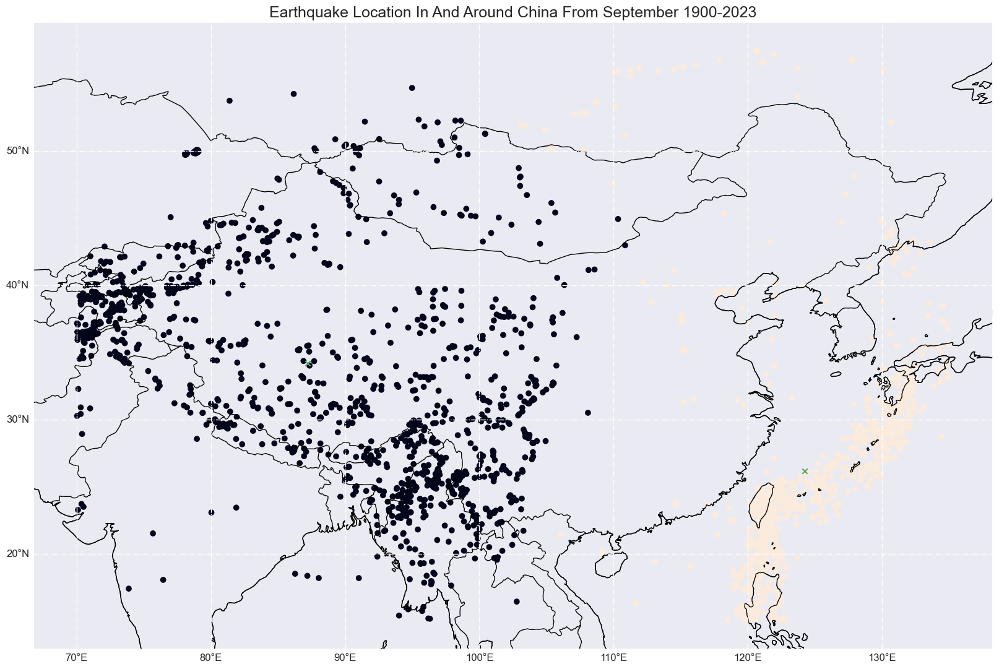

For  2  cluster:
Nearest cluster:  2
Linkage:  ward
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [124.24057785  26.17890579]
Distance of furthest point within nearest cluster from its centroid:  33.341906007343304
Distance from test point to centroid of nearest cluster:  32.4500212810263
Probability of earthquake happening at test point:  0.013072233162851879
Random Datapoints:  [(73.6758, 18.8192), (124.3074, 48.1186), (113.5325, 28.8661), (109.3864, 42.3061), (107.7783, 22.1272), (97.9935, 32.7089), (116.9958, 59.7669), (131.7107, 39.488), (98.9155, 27.0708), (72.3351, 16.235), (100.2181, 29.3309), (94.701, 55.1305), (104.1739, 40.223), (85.348, 16.0736), (91.1343, 21.1514), (103.1645, 59.9408), (113.8412, 23.183), (128.0821, 50.8542), (117.7361, 55.7967), (119.5876, 50.5386), (92.9962, 59.1439), (132.5236, 22.2533), (119.0103, 47.1818), (99.9914, 38.866), (101.8509, 56.6174), (102.5547, 52.4186), (93.0051, 54.7283), (128.4805, 35.7455)

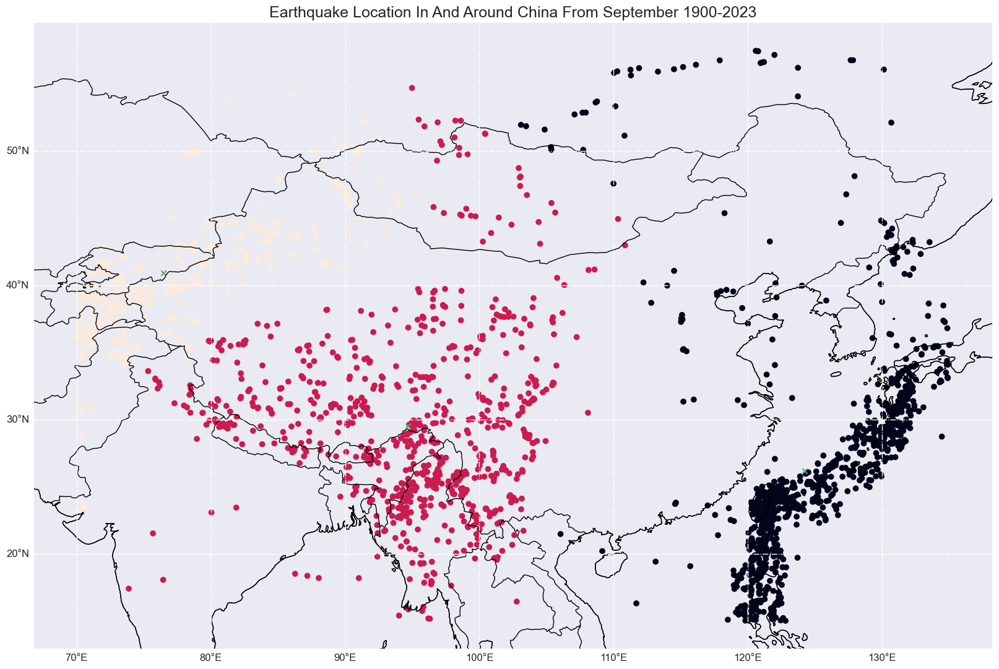

For  3  clusters:
Nearest cluster:  1
Linkage:  ward
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [124.24057785  26.17890579]
Distance of furthest point within nearest cluster from its centroid:  33.341906007343304
Distance from test point to centroid of nearest cluster:  32.4500212810263
Probability of earthquake happening at test point:  0.00560814941245806
Random Datapoints:  [(120.244, 51.3015), (120.0282, 28.5883), (117.8561, 18.8887), (114.2411, 16.3715), (70.3992, 19.6924), (112.4314, 59.2693), (100.3924, 43.999), (108.1075, 52.8607), (133.0264, 51.8032), (91.5557, 18.2345), (128.0578, 27.5548), (119.3127, 53.9256), (80.9237, 23.7285), (97.4693, 52.9871), (125.3757, 59.6819), (87.7501, 43.0289), (126.7449, 31.947), (108.154, 25.1062), (125.6846, 34.9222), (101.6069, 44.5177), (90.743, 51.5782), (99.8506, 34.3295), (117.1699, 45.0048), (116.1287, 54.3724), (122.5916, 33.3408), (111.8482, 53.8683), (73.6208, 44.6649), (104.2847, 33.1

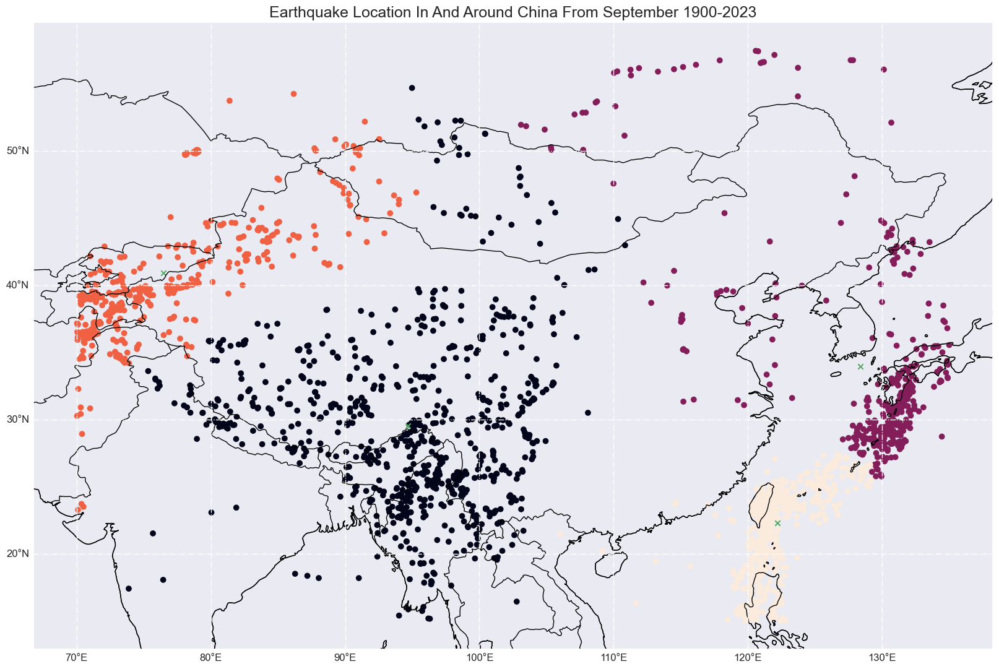

For  4  clusters:
Nearest cluster:  2
Linkage:  ward
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [128.38933209  33.96780209]
Distance of furthest point within nearest cluster from its centroid:  31.03797783836818
Distance from test point to centroid of nearest cluster:  23.97988160402838
Probability of earthquake happening at test point:  0.07425719311459145
Random Datapoints:  [(98.1726, 26.1449), (118.5357, 48.0297), (133.9095, 42.8512), (119.9187, 54.6281), (82.6154, 16.6864), (123.3073, 43.0788), (126.533, 52.9596), (77.9197, 27.2601), (125.2749, 39.9663), (121.1169, 55.8035), (70.9707, 26.2822), (74.7813, 25.214), (95.2468, 56.2083), (84.1479, 37.0998), (97.689, 57.8829), (113.9883, 33.5803), (75.7565, 27.0033), (78.0411, 59.6495), (89.2078, 23.0132), (72.0363, 21.9687), (108.7389, 37.4674), (107.8687, 47.42), (82.4447, 41.8951), (108.2109, 59.0002), (96.9653, 24.8041), (84.6905, 46.9164), (122.3382, 28.3984), (123.6018, 56.922), (9

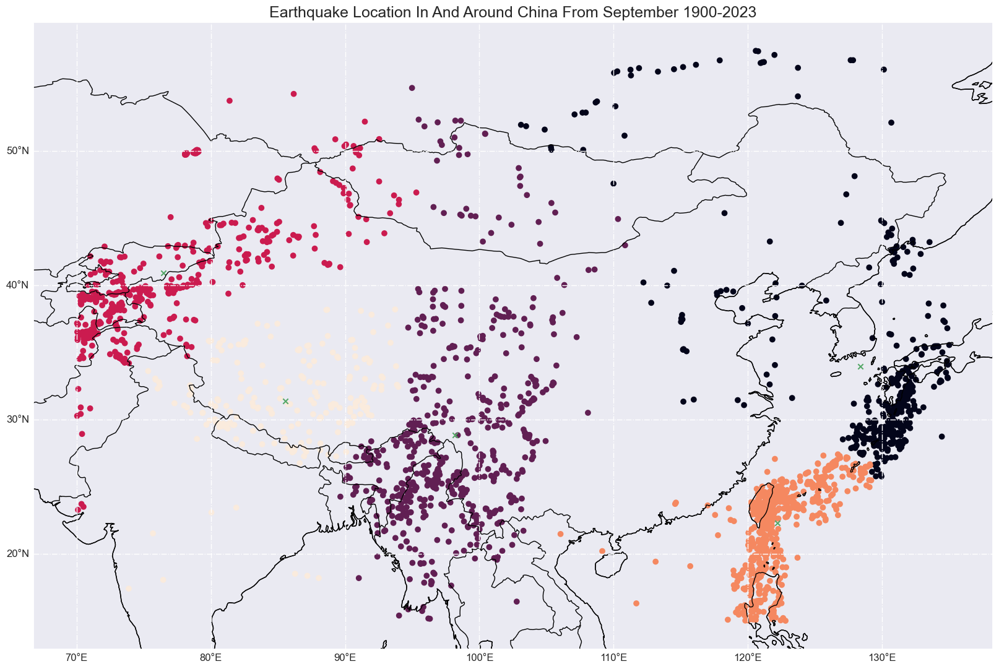

For  5  clusters:
Nearest cluster:  1
Linkage:  ward
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [128.38933209  33.96780209]
Distance of furthest point within nearest cluster from its centroid:  31.03797783836818
Distance from test point to centroid of nearest cluster:  23.97988160402838
Probability of earthquake happening at test point:  0.018950161291368024
Random Datapoints:  [(103.8124, 41.0021), (82.7282, 40.8332), (109.6304, 51.9797), (84.365, 37.0211), (101.3965, 18.478), (121.2937, 24.1365), (117.3176, 26.3801), (119.5432, 57.7213), (74.9374, 26.5452), (117.9795, 26.4594), (85.9712, 32.7522), (115.327, 53.2564), (111.4505, 23.2137), (101.0892, 17.2562), (112.2428, 48.1145), (82.6491, 16.3415), (113.435, 50.5921), (130.4262, 15.9566), (127.8445, 48.6671), (83.1629, 17.1877), (124.8785, 17.0393), (98.4027, 30.8869), (106.9207, 21.5182), (105.6215, 47.9628), (95.414, 18.0475), (109.2199, 29.4937), (130.3771, 28.5004), (81.4679, 37.5

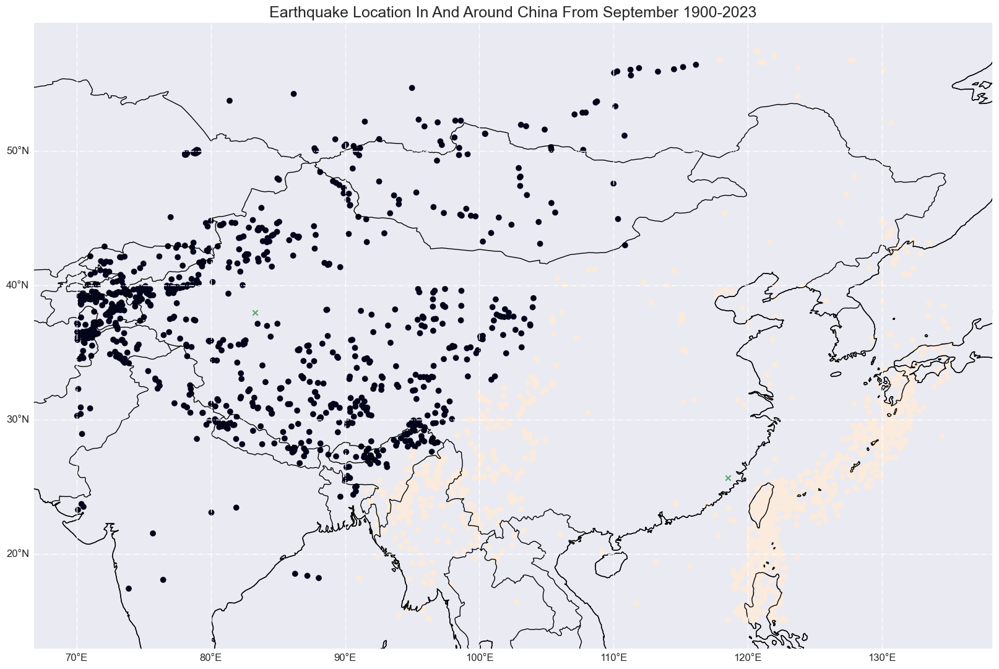

For  2  cluster:
Nearest cluster:  2
Linkage:  complete
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [118.5180647   25.66976934]
Distance of furthest point within nearest cluster from its centroid:  32.54533758503687
Distance from test point to centroid of nearest cluster:  34.76338495579192
Probability of earthquake happening at test point:  -0.042582487252049404
Random Datapoints:  [(109.0421, 38.978), (121.4178, 37.7543), (72.5683, 49.0238), (112.5384, 47.2538), (75.9964, 58.9167), (81.6167, 27.7168), (100.5492, 37.4784), (91.7862, 53.1092), (95.3853, 50.5572), (125.353, 27.9593), (76.6873, 59.8786), (112.8433, 36.3962), (86.3245, 50.0534), (104.5313, 21.5069), (130.9363, 54.3756), (75.2484, 32.0543), (112.9066, 51.621), (128.079, 33.0872), (74.6502, 51.777), (106.9276, 17.1082), (97.0568, 50.1695), (111.4731, 44.5595), (132.713, 49.8208), (124.8915, 35.8056), (116.9436, 44.9178), (132.0907, 54.6866), (124.0339, 24.9577), (87.6894, 35.

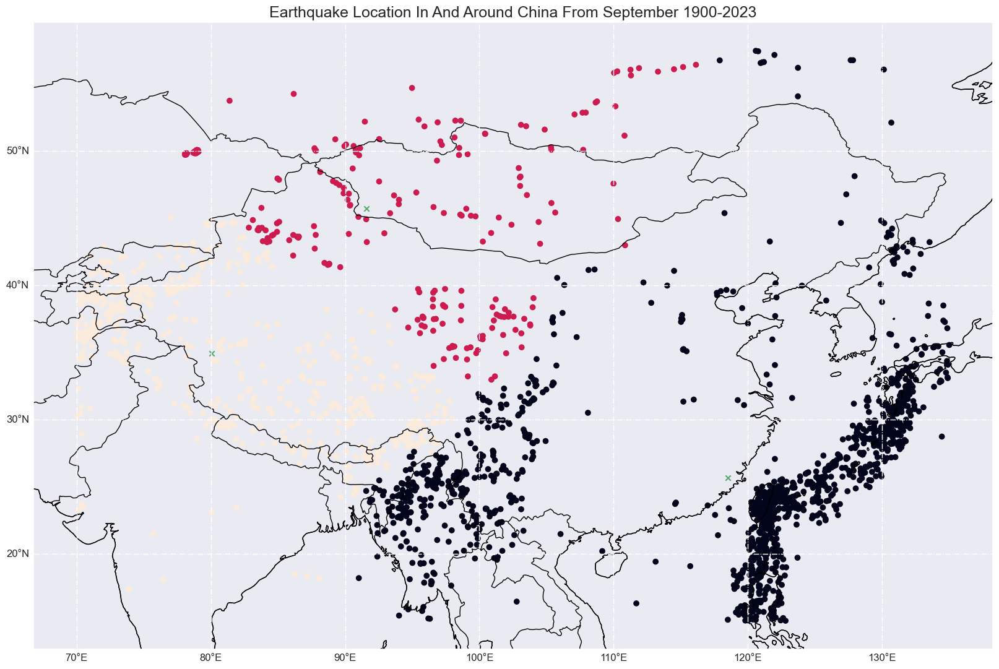

For  3  clusters:
Nearest cluster:  1
Linkage:  complete
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [118.5180647   25.66976934]
Distance of furthest point within nearest cluster from its centroid:  32.54533758503687
Distance from test point to centroid of nearest cluster:  34.76338495579192
Probability of earthquake happening at test point:  -0.018374458892706894
Random Datapoints:  [(130.1931, 31.061), (93.4594, 19.7871), (72.2311, 42.2347), (124.4946, 48.992), (128.8717, 55.9676), (91.4467, 31.2636), (100.2309, 51.941), (105.1301, 15.6822), (121.4075, 45.9725), (110.7219, 52.7463), (72.006, 34.8332), (94.0196, 46.9233), (116.1758, 55.8429), (113.7456, 24.5246), (77.5364, 44.1401), (101.1393, 48.2927), (72.8529, 41.1839), (126.6925, 52.0865), (127.0738, 43.5795), (112.737, 18.1212), (73.4948, 37.9097), (108.0272, 56.5271), (86.905, 37.7785), (117.9293, 38.1634), (104.5186, 59.6917), (132.991, 18.2865), (134.925, 39.1926), (101.6546, 27

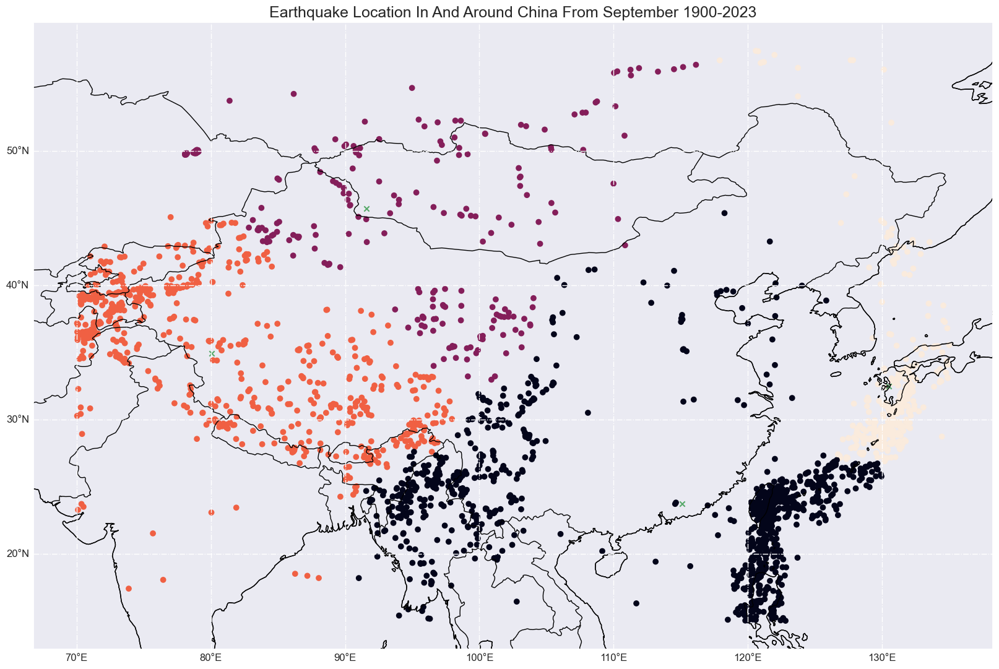

For  4  clusters:
Nearest cluster:  4
Linkage:  complete
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [130.51430623  32.50262493]
Distance of furthest point within nearest cluster from its centroid:  27.342082632256506
Distance from test point to centroid of nearest cluster:  25.2022055424691
Probability of earthquake happening at test point:  0.010889553778316317
Random Datapoints:  [(91.789, 29.8557), (70.0509, 42.5032), (75.004, 32.0342), (134.8907, 38.114), (120.1906, 35.9243), (102.7511, 42.6944), (128.2943, 29.7042), (88.8093, 20.8484), (115.8225, 42.2584), (105.177, 18.6767), (108.0412, 32.8007), (102.9603, 22.476), (81.3216, 34.307), (121.749, 32.859), (83.2868, 39.3293), (133.5099, 26.3985), (118.8529, 39.5041), (97.6256, 41.7387), (75.9687, 47.0279), (109.9322, 17.473), (93.4753, 31.6755), (119.2726, 43.3462), (94.9259, 59.8039), (85.0809, 42.2475), (70.3872, 55.3269), (101.0438, 16.5453), (126.6832, 52.1336), (88.8451, 37.1222)

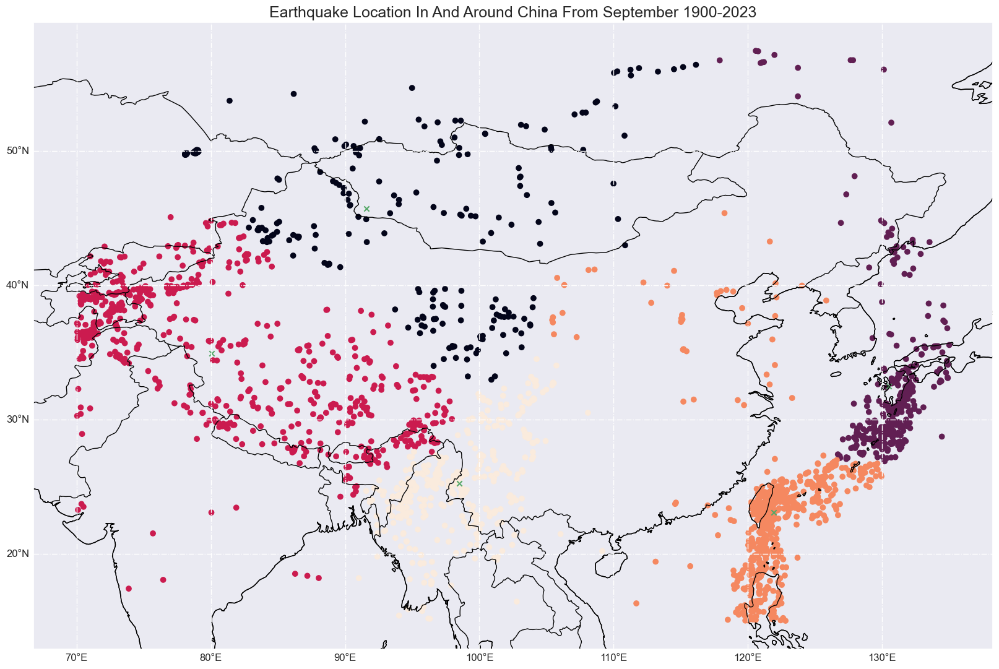

For  5  clusters:
Nearest cluster:  2
Linkage:  complete
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [130.51430623  32.50262493]
Distance of furthest point within nearest cluster from its centroid:  27.342082632256506
Distance from test point to centroid of nearest cluster:  25.2022055424691
Probability of earthquake happening at test point:  0.011096130679259986
Random Datapoints:  [(80.3548, 19.8161), (120.5856, 29.8978), (101.6354, 42.2018), (77.4436, 37.3151), (124.095, 43.9641), (116.8408, 21.6316), (75.9965, 28.8143), (102.1449, 27.394), (99.3965, 28.7253), (81.0308, 22.3282), (74.2984, 35.5587), (112.7825, 51.5964), (94.2339, 21.8349), (118.46, 26.5309), (108.2068, 52.9949), (82.1327, 59.164), (76.5931, 47.8276), (109.5663, 48.8861), (127.475, 59.8846), (88.2719, 31.3887), (98.7254, 44.7102), (105.8868, 47.2889), (110.8698, 30.9717), (106.916, 55.2882), (121.5614, 21.9105), (99.8632, 30.5808), (84.7383, 29.7094), (75.2773, 41.8866

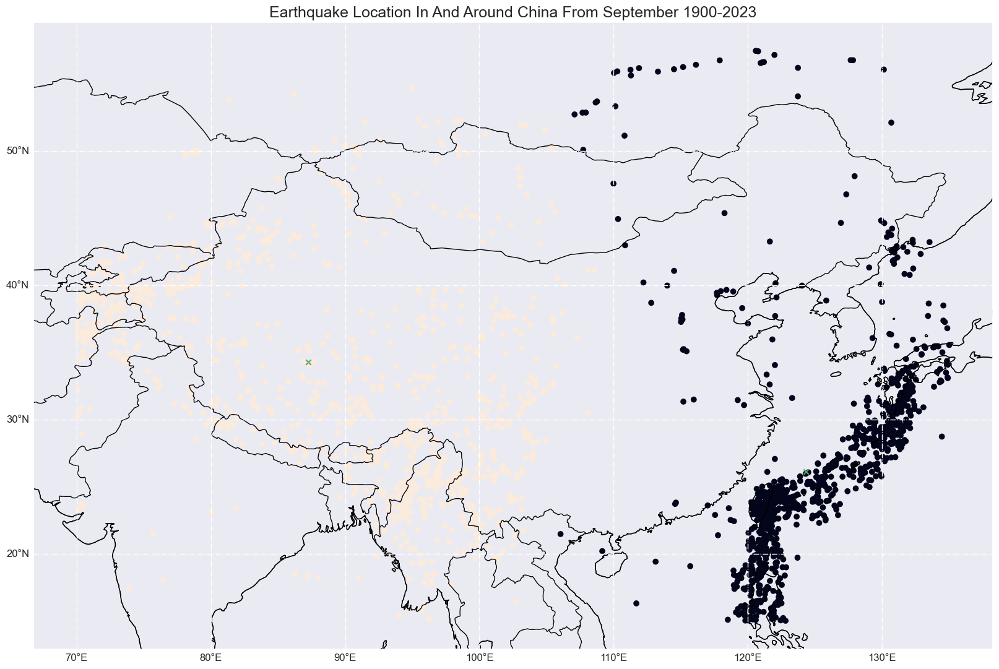

For  2  cluster:
Nearest cluster:  1
Linkage:  average
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [124.29608175  26.10980433]
Distance of furthest point within nearest cluster from its centroid:  32.96725120787842
Distance from test point to centroid of nearest cluster:  32.50360435652144
Probability of earthquake happening at test point:  0.007206933494481052
Random Datapoints:  [(95.8364, 43.3069), (105.2282, 29.5036), (77.6835, 34.9013), (92.4138, 22.3888), (110.6527, 41.5594), (71.2196, 33.7394), (100.6228, 44.477), (111.6782, 38.447), (89.012, 47.4957), (114.67, 17.0828), (122.8366, 35.8149), (116.1743, 30.0189), (130.4403, 26.9592), (114.8963, 17.5749), (75.1842, 39.1095), (83.4968, 34.1624), (75.9389, 16.7709), (115.0333, 41.4843), (79.3957, 35.7453), (114.4093, 41.1922), (86.7707, 49.2626), (116.2287, 26.4344), (83.638, 54.7171), (75.1147, 31.5792), (71.9077, 24.0757), (107.7729, 46.8563), (96.5686, 27.9722), (72.8468, 38.9341),

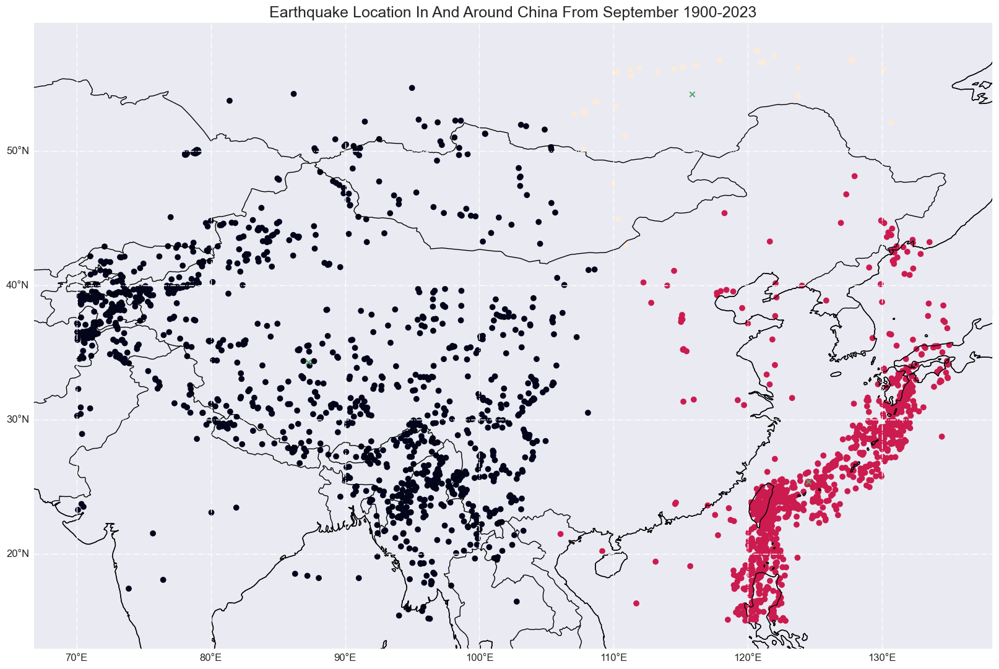

For  3  clusters:
Nearest cluster:  3
Linkage:  average
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [115.817       54.27118182]
Distance of furthest point within nearest cluster from its centroid:  15.017438334282147
Distance from test point to centroid of nearest cluster:  16.671635762149585
Probability of earthquake happening at test point:  -0.0013706668332654237
Random Datapoints:  [(119.3931, 53.8618), (79.1391, 53.4166), (114.5125, 24.772), (98.2936, 33.6868), (102.5602, 46.221), (77.3032, 58.7052), (119.6678, 38.3023), (92.5437, 56.8088), (120.8464, 29.963), (70.1114, 36.8139), (124.7449, 30.8769), (79.2402, 47.8443), (116.7716, 31.3086), (114.7708, 26.7245), (87.971, 57.7238), (85.6396, 32.3064), (133.424, 43.839), (120.3738, 34.5637), (120.7662, 51.7463), (83.0269, 37.0161), (70.5799, 40.602), (79.62, 21.282), (102.441, 46.552), (113.8517, 20.0726), (100.2921, 28.0789), (113.1977, 48.0378), (109.3958, 46.5374), (127.3456, 47.390

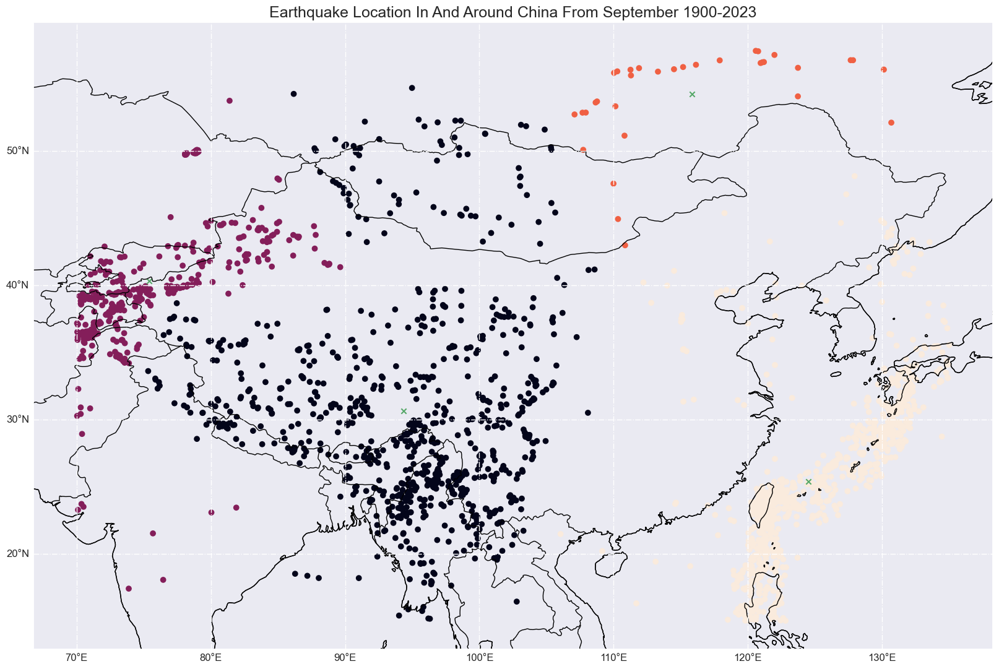

For  4  clusters:
Nearest cluster:  3
Linkage:  average
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [115.817       54.27118182]
Distance of furthest point within nearest cluster from its centroid:  15.017438334282147
Distance from test point to centroid of nearest cluster:  16.671635762149585
Probability of earthquake happening at test point:  -0.0523345518155889
Random Datapoints:  [(112.9191, 51.0716), (123.8551, 31.8284), (99.9745, 52.3585), (120.4504, 50.8405), (86.4023, 26.874), (122.7279, 22.1917), (75.9889, 15.9982), (127.4663, 22.2108), (86.3957, 17.0558), (100.9205, 41.1713), (130.4604, 49.3684), (111.1258, 53.7693), (109.8191, 29.2949), (130.4944, 47.141), (94.9617, 42.3391), (72.2851, 38.0808), (103.709, 58.561), (102.3326, 24.4024), (90.0868, 47.9201), (104.1295, 55.8958), (121.3178, 47.2014), (107.2445, 51.4842), (113.818, 26.9217), (134.5392, 37.2338), (107.8839, 21.6928), (77.8212, 15.6465), (78.8458, 54.1328), (115.5359, 

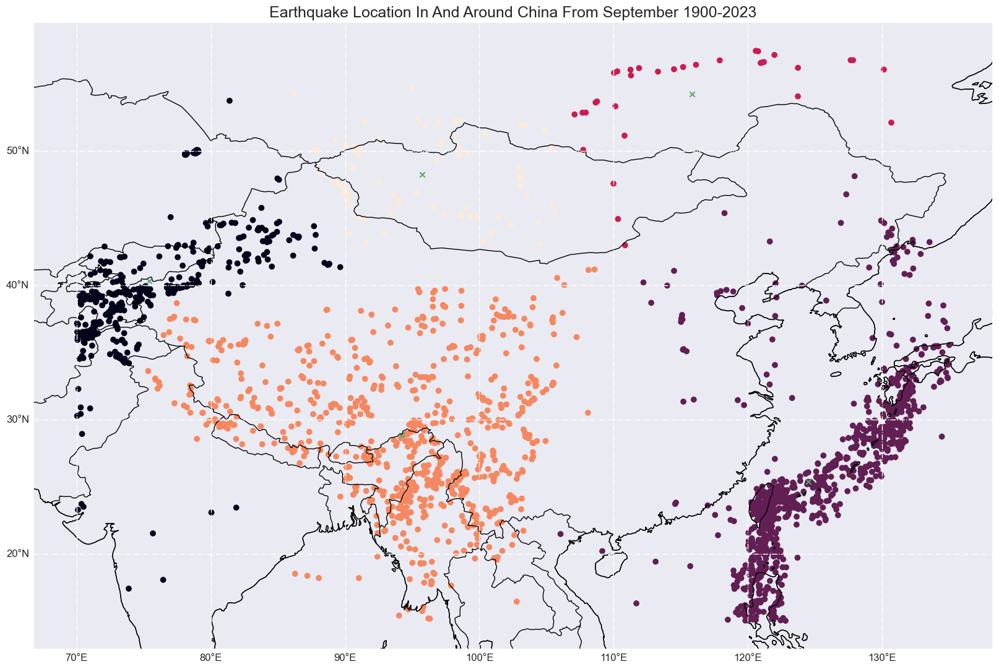

For  5  clusters:
Nearest cluster:  3
Linkage:  average
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [115.817       54.27118182]
Distance of furthest point within nearest cluster from its centroid:  15.017438334282147
Distance from test point to centroid of nearest cluster:  16.671635762149585
Probability of earthquake happening at test point:  -0.0031982226109526554
Random Datapoints:  [(101.2711, 27.1178), (98.1392, 50.4258), (132.1761, 54.1631), (83.6238, 46.9725), (116.0494, 49.0263), (110.3357, 39.1038), (72.0074, 53.1622), (82.5146, 36.1327), (110.3932, 32.8047), (91.9747, 26.8522), (129.537, 29.1807), (93.8095, 49.5631), (102.5775, 29.0453), (104.7362, 23.8323), (111.184, 45.6953), (91.7569, 47.3435), (71.8603, 24.9605), (104.3824, 49.3737), (129.8948, 43.3392), (79.7588, 22.981), (104.6445, 22.9567), (107.2961, 41.9589), (83.8822, 26.6803), (121.234, 23.4734), (108.2216, 52.086), (84.3524, 32.154), (74.8336, 40.5052), (130.3217, 2

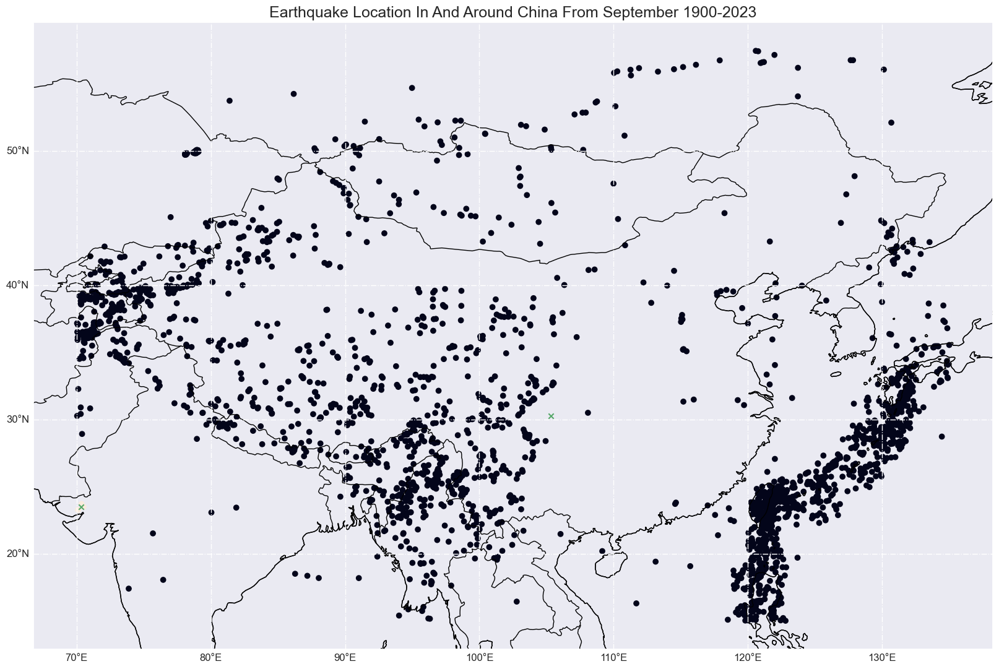

For  2  cluster:
Nearest cluster:  1
Linkage:  single
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [105.34334398  30.2982077 ]
Distance of furthest point within nearest cluster from its centroid:  36.31432919494745
Distance from test point to centroid of nearest cluster:  38.29385823777091
Probability of earthquake happening at test point:  -6.166398491120737e-05
Random Datapoints:  [(126.9219, 19.385), (96.8978, 35.0016), (129.1865, 47.1518), (118.3775, 58.3759), (77.9435, 16.591), (116.3484, 55.4879), (90.8516, 49.8644), (121.5479, 19.5856), (111.0856, 38.3041), (83.8278, 42.2236), (128.9516, 46.8139), (116.9882, 44.3087), (121.2639, 43.5512), (102.8529, 59.2473), (123.7517, 39.9262), (127.7266, 24.6782), (74.4774, 20.9395), (96.7701, 30.8032), (84.884, 31.7595), (87.5426, 51.5592), (87.2825, 24.4553), (97.6042, 37.7905), (88.7377, 36.3499), (78.36, 29.5068), (129.0868, 59.203), (80.7086, 29.9325), (122.3023, 44.2781), (83.2395, 45.6373

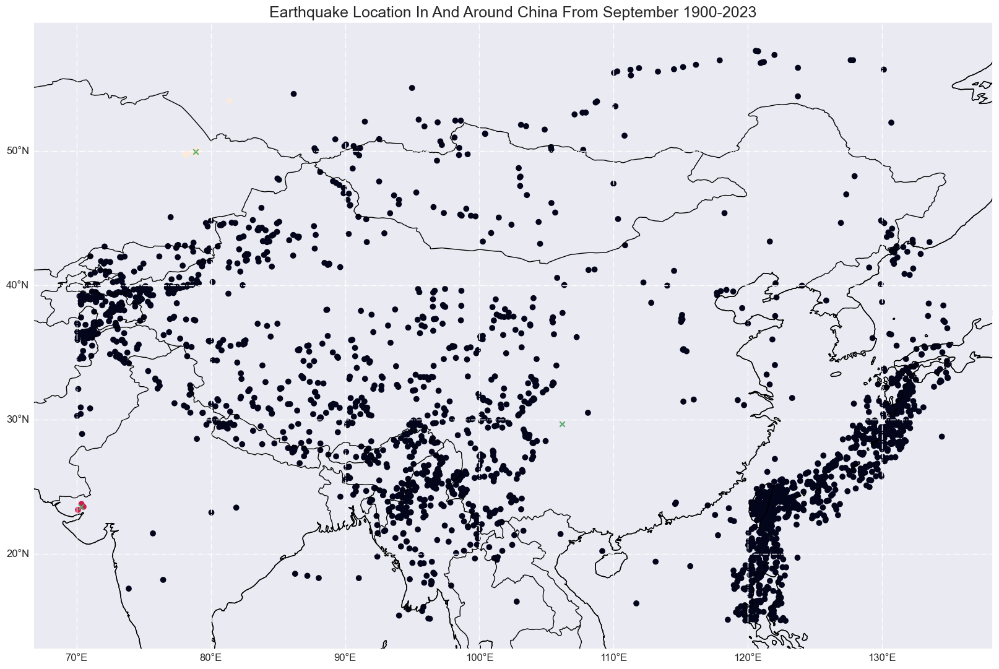

For  3  clusters:
Nearest cluster:  1
Linkage:  single
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [106.15792809  29.69345105]
Distance of furthest point within nearest cluster from its centroid:  37.28307457041247
Distance from test point to centroid of nearest cluster:  38.1690192346277
Probability of earthquake happening at test point:  -0.0007078617556594963
Random Datapoints:  [(98.4255, 17.1146), (134.8116, 20.3682), (128.2879, 16.7706), (106.1532, 36.8789), (100.098, 57.5475), (86.3394, 57.2344), (86.3755, 15.7912), (122.0427, 30.912), (105.6058, 57.364), (92.9716, 51.4914), (80.9509, 34.7257), (121.3931, 31.2316), (97.0302, 34.622), (79.5473, 55.5714), (107.1616, 30.3226), (99.0846, 37.6373), (125.8699, 19.3958), (124.2672, 50.9769), (101.5779, 16.5586), (95.3484, 36.9999), (117.3039, 28.9246), (127.5517, 46.3379), (131.1779, 18.1521), (71.3423, 16.4945), (121.2162, 26.6618), (131.4884, 23.1012), (93.8928, 36.9779), (118.9301, 36

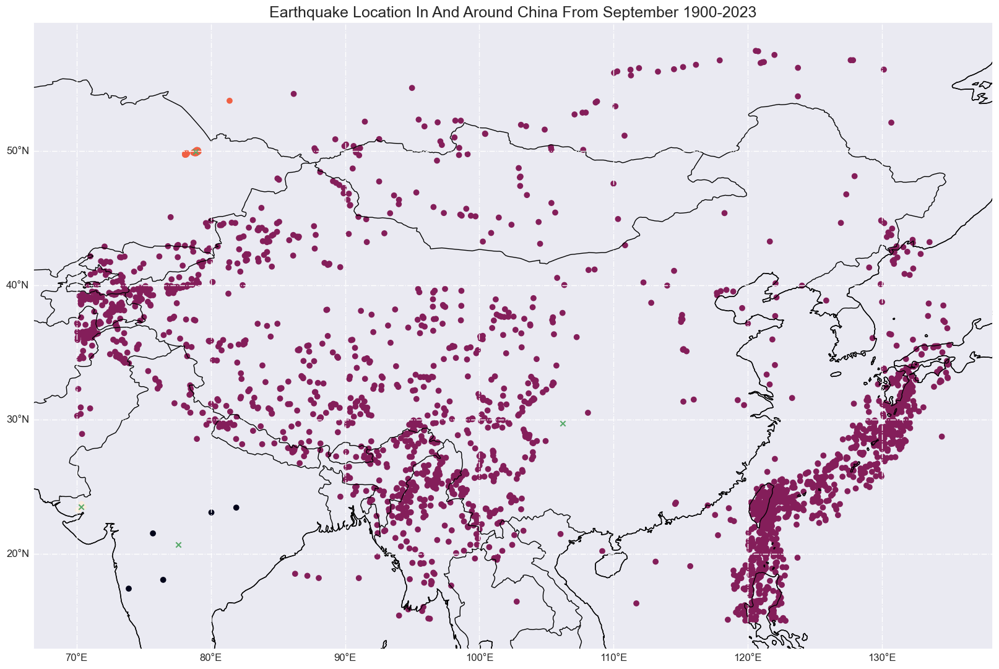

For  4  clusters:
Nearest cluster:  2
Linkage:  single
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [106.21361294  29.71096928]
Distance of furthest point within nearest cluster from its centroid:  37.32970706561096
Distance from test point to centroid of nearest cluster:  38.118289586051134
Probability of earthquake happening at test point:  -2.3896830294922588e-05
Random Datapoints:  [(90.9139, 52.0362), (78.0835, 52.7184), (87.5473, 25.4095), (86.9289, 32.5408), (86.2158, 55.7297), (93.8478, 32.6625), (122.6856, 31.8322), (105.591, 25.8598), (120.523, 17.3624), (82.4023, 48.7175), (83.4236, 58.0477), (127.4999, 21.751), (119.762, 17.0564), (90.352, 52.3241), (132.6992, 33.8025), (112.2563, 43.8198), (129.4377, 47.4985), (74.8743, 23.3053), (74.0394, 28.2665), (108.086, 18.6064), (95.6552, 37.9988), (122.5108, 42.9215), (79.8029, 53.5848), (92.5471, 39.8542), (71.3017, 48.7789), (134.9244, 25.7907), (124.4406, 29.9998), (127.3955, 33.81

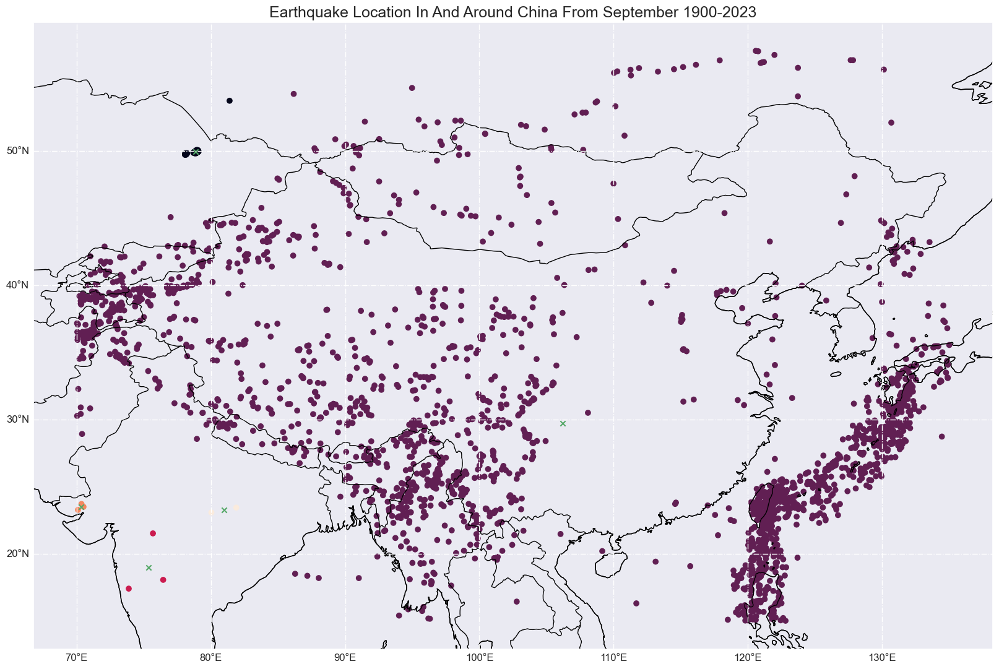

For  5  clusters:
Nearest cluster:  2
Linkage:  single
Coordinates of test point:  (132.1422, 57.6522)
Coordinates of centroid of nearest cluster:  [106.21361294  29.71096928]
Distance of furthest point within nearest cluster from its centroid:  37.32970706561096
Distance from test point to centroid of nearest cluster:  38.118289586051134
Probability of earthquake happening at test point:  -1.593122019661506e-05
Random Datapoints:  [(84.6844, 28.9975), (84.0044, 44.5068), (75.9768, 26.1044), (130.3922, 59.5778), (104.0758, 42.1159), (101.1068, 31.9958), (97.3658, 16.7495), (71.6918, 37.6019), (131.1895, 51.2604), (76.9667, 51.9011), (72.9948, 16.8509), (99.9022, 16.7723), (112.193, 15.761), (74.3492, 38.2204), (105.5353, 44.5396), (91.4559, 47.2682), (76.1046, 19.1254), (71.2707, 16.587), (108.7606, 50.1459), (108.3814, 38.697), (94.4955, 42.1496), (86.6214, 17.2501), (77.6608, 50.2792), (73.1522, 40.779), (70.7251, 20.4409), (133.3583, 18.3543), (130.737, 16.4662), (104.7862, 20.238),

In [21]:
# Apply hierarchical clustering on train set
import IPython.display as display
from sklearn.neighbors import NearestCentroid

#Turn data into a set of points
train_coordinates = list(zip(X_train,y_train))

random.seed(2)
testing = (round(random.uniform(70,135), 4), round(random.uniform(15,60), 4))

for linkages in ("ward", "complete", "average", "single"):
    for i in range(2, 6):
        model_train = AgglomerativeClustering(n_clusters=i,affinity='euclidean', linkage= linkages)
        cluster_train = model_train.fit_predict(train_coordinates)

        #centroid function
        clf = NearestCentroid()
        clf.fit(train_coordinates, cluster_train)

        # Find the number of data points in each cluster
        num_data_points = np.bincount(cluster_train)

        #Centroids of each N cluster
        hier_centers = np.array(clf.centroids_)

        plt.figure(figsize=(20, 20))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND, edgecolor='black', facecolor="none", linewidth=1)
        ax.add_feature(cfeature.BORDERS)


        gl = ax.gridlines(linestyle='-.', draw_labels=True)
        gl.top_labels = False
        gl.right_labels = False
        ax.coastlines()

        plt.scatter(X_train, y_train, c=cluster_train)
        plt.scatter(hier_centers[:, 0], hier_centers[:, 1], marker="x", color='g')
        plt.title('Earthquake Location In And Around China From September 1900-2023', fontsize=18)

        plt.show()

        #Find nearest Cluster
        nearestCluster_1=hier_centers[0]
        min_distance = math.dist(testing,hier_centers[0])
        x=0
        for j in range(len(hier_centers)):
            dist = math.dist(testing, hier_centers[j])
            if dist < min_distance:
                min_distance = dist
                nearestCluster_1=hier_centers[j]
                x=j

        if i==2:
            print("For ",i, " cluster:")
        else:
            print("For ",i, " clusters:")


        print("Nearest cluster: ", x+1)
        print("Linkage: ",linkages)
        print("Coordinates of test point: ", testing)
        print("Coordinates of centroid of nearest cluster: ", nearestCluster_1)

        furthest_dist = 0

        #Find furthest point in cluster and distance between centroid and furthest distance
        cluster_points_1 = np.array(train_coordinates)[cluster_train == x]
        distances_1 = [np.linalg.norm(p - hier_centers[x]) for p in cluster_points_1]
        furthest_point_index_1 = np.argmax(distances_1)
        furthest_point_1 = cluster_points_1[furthest_point_index_1]
        furthest_dist = distances_1[furthest_point_index_1]     



        print("Distance of furthest point within nearest cluster from its centroid: ", furthest_dist)
        print("Distance from test point to centroid of nearest cluster: ", min_distance)
        probability=((furthest_dist - min_distance)/furthest_dist)*(num_data_points[j]/len(data))
        print("Probability of earthquake happening at test point: ", probability)
        testData1= list(zip(X_test, y_test))
        randData1=[]
        while len(randData1)!=len(testData1):
            count=0
            randomPoint=(round(random.uniform(70,135), 4), round(random.uniform(15,60), 4))
            for ii in range(len(randData1)):
                if randomPoint==randData1[ii]:
                    count=count+1
            if count>0:
                continue
            else:
                randData1.append(randomPoint)

        print("Random Datapoints: ", randData1)
        print("No. of test data: ", len(testData1))
        print("No. of random data: ", len(randData1))

        probabilites=[]

        for jj in randData1:
            nearestClust=hier_centers[0]
            min_dist = math.dist(jj,hier_centers[0])
            X=0
            for cc in range(len(hier_centers)):
                dist = math.dist(jj, hier_centers[cc])
                if dist < min_dist:
                    min_dist = dist
                    nearestClust=hier_centers[cc]
                    X=cc
            ftDist=0
            count=0
            for e in cluster:
                count=count+1
                if math.dist(e,hier_centers[X])>ftDist:
                    ftDist=math.dist(e,hier_centers[X])
            prob=((ftDist - min_dist)/ftDist)*(count/len(data))
            probabilites.append(prob)

        print("Probabilities: ", probabilites)
        print("No. of probabilities: ", len(probabilites))


        predictionError=[]
        ct=0
        for kk in randData1:
            for ll in testData1:
                if ll[0]-0.01<kk[0]<ll[0]+0.01 and ll[1]-0.01<kk[1]<ll[1]+0.01:
                    pError=1-probabilites[ct]
                else:
                    pError=probabilites[ct]
            predictionError.append(pError)
            ct=ct+1

        print("Prediction Errors: ", predictionError)
        print("No. of predicition error: ", len(predictionError))
        avePE=np.mean(predictionError)
        print("Average Prediction Error: ", avePE)
        print("\n")

        for j in range(i):
            #Find furthest point in cluster and distance between centroid and furthest distance
            cluster_points = np.array(train_coordinates)[cluster_train == j]
            distances = [np.linalg.norm(p - hier_centers[j]) for p in cluster_points]
            furthest_point_index = np.argmax(distances)
            furthest_point = cluster_points[furthest_point_index]
            furthest_distance = distances[furthest_point_index]

            print("For Cluster ", j+1,": ")
            print("Number of points in cluster: ", num_data_points[j])
            print("Coordinates of centroid: ", hier_centers[j])
            print("Coordinates of Furthest Point: ", furthest_point)
            print("Furthest distance of point from centroid: ", furthest_distance)
            print("Probability assigned to the cluster: ", num_data_points[j]/len(data))
            print("Distance to test point: ", math.dist(testing, hier_centers[j]))
            print("\n")

To determine the prediction error using the Hierarchical Clustering Model, we did the same thing as what we did for K-Means, using 664 random datasets to test the probability of earthquake happening using the train set against the test set, and then calculate the average prediction error for the different linkages and number of clusters.

By analysing every iteration of the number of cluster and linkage used in the Hierarchical Clustering Model above, we can see that the lowest average prediction error occurs when the hyperparameters of linkage and number of clusters are "average" and 2 respectively. Therefore, using 2 clusters together with the “average” linkage, is the best for hierarchical clustering.

Comparing the the average prediction error between 5 clusters in K-Means Clustering and 2 clusters in Hierarchical Clustering, we found out that the K-Means Clustering with 5 clusters is a better model in predicting the probability of an earthquake happening at a location, as compared to the Hierarchical Clustering with 2 clusters when linkage is "average", as the average prediction error for K-Means Clustering with 5 clusters is about 0.05, which is lower than the Hierarchical Clustering with 2 clusters when linkage is "average", with an average prediction error of about 0.10.

## Determining the Probability of an earthquake happening at a location using the K-Means Clustering Model with 5 cluster

Having decided which clustering model and number of clusters would be the best to predict the probability of an earthquake at any location, we used the model to test the probability of an earthquake at 2 extreme locations, one near the centroid of a cluster and one that is very far from the centroid of the nearest cluster, so that we can test the limits of our model.

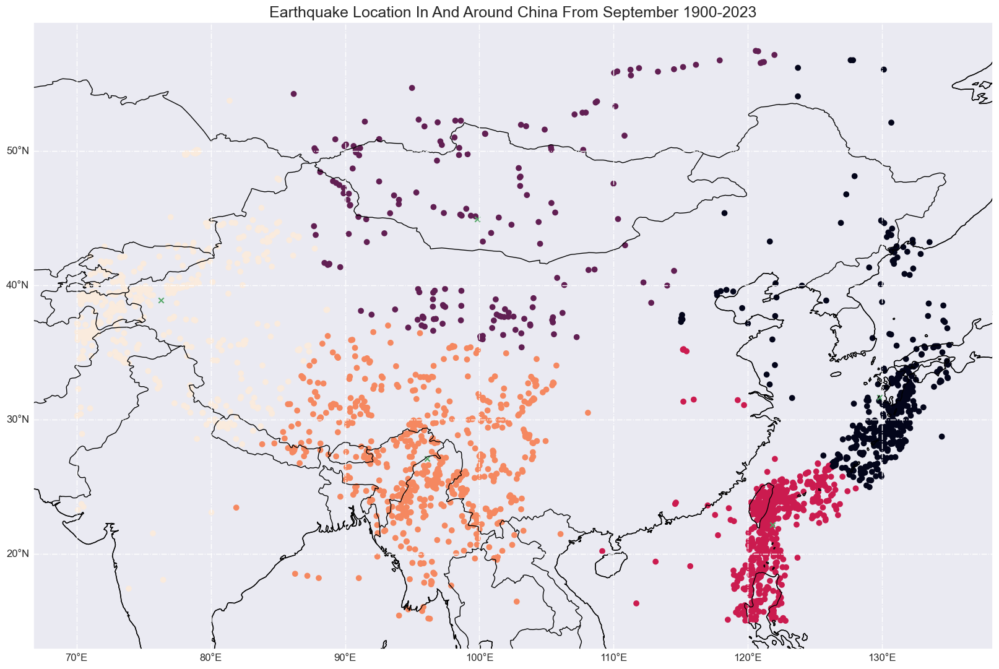

In [22]:
plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor="none", linewidth=1)
ax.add_feature(cfeature.BORDERS)


gl = ax.gridlines(linestyle='-.', draw_labels=True)
gl.top_labels = False
gl.right_labels = False
ax.coastlines()

kmeans = KMeans(n_clusters=5, random_state=1)
kmeans.fit(data)
centers = np.array(kmeans.cluster_centers_)

plt.scatter(x=X_train, y=y_train, c =kmeans.labels_)
plt.scatter(centers[:,0], centers[:,1], marker="x", color='g')
plt.title('Earthquake Location In And Around China From September 1900-2023', fontsize=18)

plt.show()

In [23]:
testPoint = (122,22)
centers=kmeans.cluster_centers_
lon=[]
lati=[]
for c in centers:
    lon.append(c[0])
    lati.append(c[1])

centers=list(zip(lon,lati))

nearestCluster=centers[0]
min_distance = math.dist(testPoint,centers[0])
x=0
for j in range(len(centers)):
    dist = math.dist(testPoint, centers[j])
    if dist < min_distance:
        min_distance = dist
        nearestCluster=centers[j]
        x=j
labels=kmeans.labels_
df = pd.concat([X_train, y_train],axis=1, join="inner")
cluster=df[labels==x]
cluster=list(zip(cluster["Longitude"],cluster["Latitude"]))
furthestDist=0
count=0
for d in cluster:
    count=count+1
    if math.dist(d,centers[x])>furthestDist:
        furthestDist=math.dist(d,centers[x]) 

probability=((furthestDist - min_distance)/furthestDist)*(count/len(data))
print("Probability of point:", probability)    

Probability of point: 0.30493606860643746


In [24]:
testPoint_1 = (69,17)
centers=kmeans.cluster_centers_
lon=[]
lati=[]
for c in centers:
    lon.append(c[0])
    lati.append(c[1])

centers=list(zip(lon,lati))

nearestCluster=centers[0]
min_distance = math.dist(testPoint_1,centers[0])
x=0
for j in range(len(centers)):
    dist = math.dist(testPoint_1, centers[j])
    if dist < min_distance:
        min_distance = dist
        nearestCluster=centers[j]
        x=j
labels=kmeans.labels_
df = pd.concat([X_train, y_train],axis=1, join="inner")
cluster=df[labels==x]
cluster=list(zip(cluster["Longitude"],cluster["Latitude"]))
furthestDist=0
count=0
for d in cluster:
    count=count+1
    if math.dist(d,centers[x])>furthestDist:
        furthestDist=math.dist(d,centers[x]) 

probability=((furthestDist - min_distance)/furthestDist)*(count/len(data))
print("Probability of point:", probability) 

Probability of point: -0.015639376337033557


As can be seen from above, the probability of earthquake happening at the first location is about 0.30, which is almost the same as the probability of an earthquake occurring at the centroid of that cluster. However, the probability of the earthquake happening at the second location is negative. As such, when analysing the K-Means Clustering Model used to calculate the probability of the earthquake, we realised that the heuristic approach has its limitations. For example, if the location is exactly the same or further than the furthest point from the cluster, the probability of an earthquake happening will be 0 or negative respectively. 

Hence, we propose using a method where we calculate the probability of an earthquake at a location by finding the number of earthquakes in a radius around the location, divided by the total number of earthquakes, which would be more accurate, as it takes into account the frequency of earthquakes in a radius around the chosen location.

## Proposed Method

The probability of an earthquake happening at a location for our proposed method is determined by the number of earthquakes in a radius around the location divided by the total number of earthquakes.

In our case, we have decided to choose the radius to be 500km because when doing our research, we found out that the most powerful earthquake in history could be felt 1000km away. In addition, a magnitude 5.5  earthquake usually can be felt as far as 500km away. As such, we decided that 500km would be a good guideline for our radius.

In [25]:
from geopy import distance

def compute_distances(lat, lon):
    distances_geopy = np.empty((lat_long.shape[0]), dtype=np.float32)
    for i in range(lat_long.shape[0]):
        row = lat_long.iloc[i]
        distances_geopy[i] = distance.distance((row['Latitude'], row['Longitude']), (lat, lon)).km
    return distances_geopy

distances_geopy = compute_distances(22,122) 

def prob_quake_leq(distance_geopy, k):
    return sum(1 if d <= k else 0 for d in distance_geopy) / distance_geopy.shape[0]

print(f"Prob(earthquake < 500km) = {prob_quake_leq(distances_geopy, 500)}")

Prob(earthquake < 500km) = 0.25060313630880576


In [26]:
distances_geopy_1 = compute_distances(17,69) 
print(f"Prob(earthquake < 500km) = {prob_quake_leq(distances_geopy_1, 500)}")

Prob(earthquake < 500km) = 0.0


Using our proposed method to calculate the probability of an earthquake happening at the same 2 points chosen for the K-Means model earlier, we can see that for the first point, the probability is about 0.23 while for the second point, the probability is zero, which is reasonable given that there is only one earthquake within 500km radius, and hence the probability would be too close to zero.